<a href="https://colab.research.google.com/github/SubHans/PCVK_SEM6/blob/main/Minggu3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

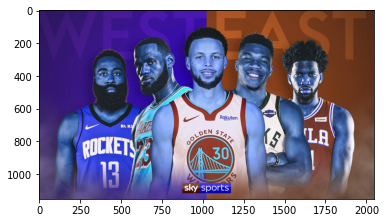

In [1]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import math

img = cv.imread('/content/drive/MyDrive/Pcvk/skysports-nba-sky-live-live-on-sky_4810101.jpg')
plt.imshow(img)

Mengubah tingkat kecerahan citra
--------------------------------
Masukkan nilai Kecerahan: 50


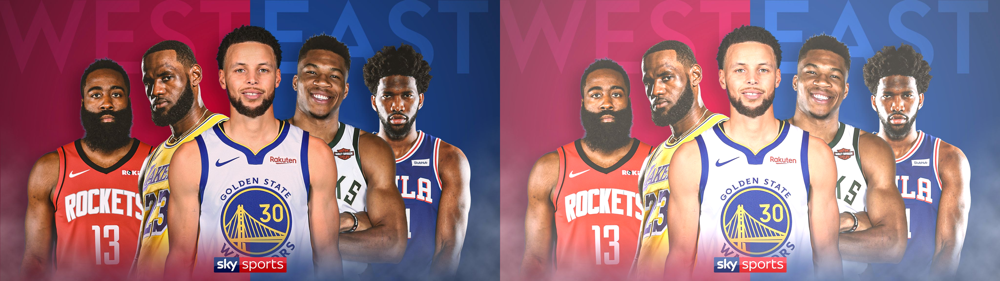

In [2]:
print('Mengubah tingkat kecerahan citra')
print('--------------------------------')
try:
  brightness = int(input('Masukkan nilai Kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/Pcvk/skysports-nba-sky-live-live-on-sky_4810101.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

no 1

Mengubah tingkat kecerahan citra
--------------------------------
Masukan nilai kecerahan [-255 - 255]: 20 
Masukan kontras [1.0 - 3.0]: 2.0


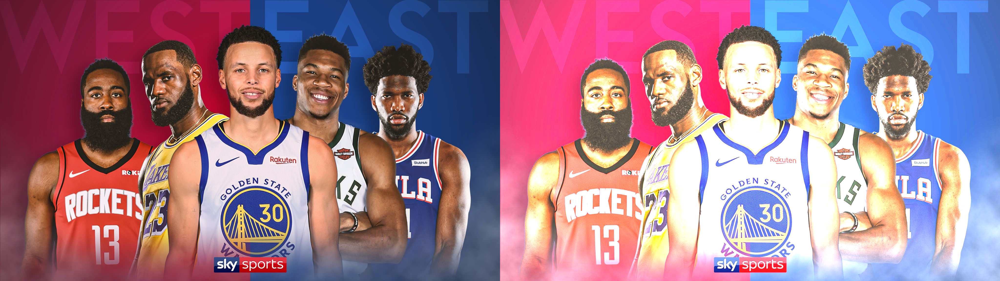

In [3]:
print('Mengubah tingkat kecerahan citra')
print('--------------------------------')
try:
  brightness = int(input('Masukan nilai kecerahan [-255 - 255]: '))
  contrast = float(input('Masukan kontras [1.0 - 3.0]: ' ))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/Pcvk/skysports-nba-sky-live-live-on-sky_4810101.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(contrast * original[y,x,c] + brightness, -255, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta-brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

no 2

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukan nilai kecerahan: 40


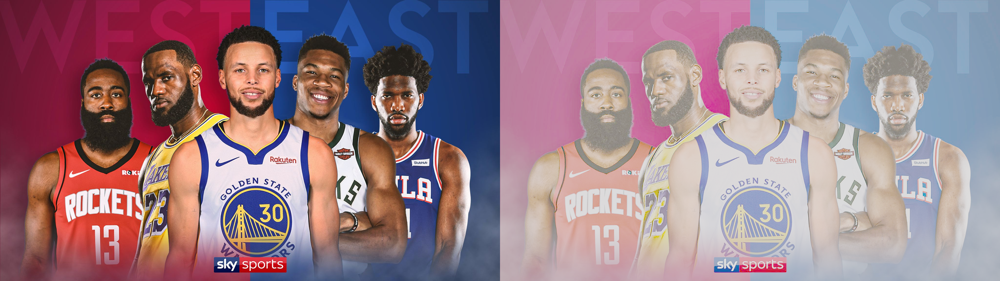

In [4]:
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('--------------------------------------------------------')
try:
  brightness = int(input('Masukan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/Pcvk/skysports-nba-sky-live-live-on-sky_4810101.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(brightness * math.log(original[y,x,c] + 1), -255, 255)


#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta-brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

no 3 

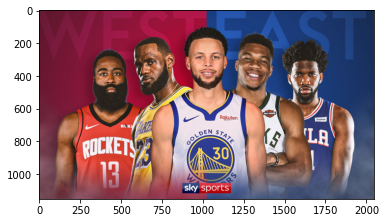

In [7]:

img = cv.imread('/content/drive/MyDrive/Pcvk/skysports-nba-sky-live-live-on-sky_4810101.jpg')
img_color = cv.cvtColor(img,cv.COLOR_BGR2RGB)

plt.imshow(img_color)

no 3 Averaging


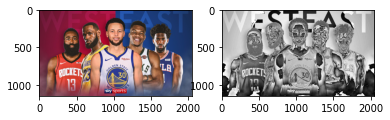

In [8]:
R, G, B = img_color[:,:,0], img_color[:,:,1], img_color[:,:,2]

gray_img = 0.3 * (R + G + B)

f, axarr = plt.subplots(1,2)
axarr[0].imshow(img_color)
axarr[1].imshow(gray_img, cmap='gray')
plt.show(block=True)

no 3 lightness



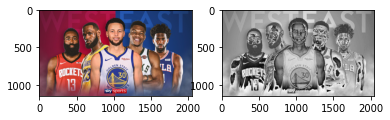

In [9]:
R, G, B = img_color[:,:,0], img_color[:,:,1],img_color[:,:,2]
max_channels = np.maximum(np.maximum(R, G), B) #np.max(color_img, axis=2)
min_channels = np.minimum(np.minimum(R, G), B) #np.min(color_img, axis=2)

gray_img = 0.5 * (max_channels + min_channels)

f, axarr = plt.subplots(1,2)
axarr[0].imshow(img_color)
axarr[1].imshow(gray_img, cmap='gray')

no 3 Luminance

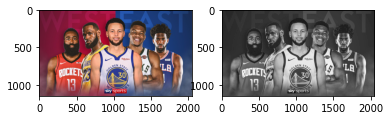

In [10]:
R, G, B = img_color[:,:,0], img_color[:,:,1],img_color[:,:,2]

gray_img = (0.21 * R) + (0.72 * G) + (0.07 * B)

f, axarr = plt.subplots(1,2)
axarr[0].imshow(img_color)
axarr[1].imshow(gray_img, cmap='gray')

No 4

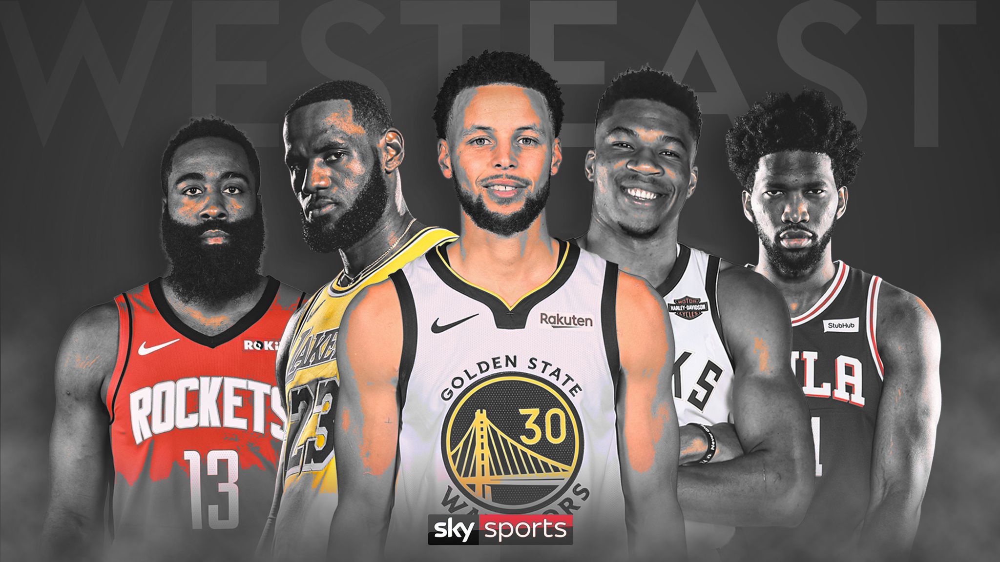

In [11]:
img = cv.imread('/content/drive/MyDrive/Pcvk/skysports-nba-sky-live-live-on-sky_4810101.jpg')

# creating mask using thresholding over `red` channel (use better use histogram to get threshoding value)
# I have used 200 as thershoding value it can be different for different images
ret, mask = cv.threshold(img[:, :,2], 210, 255, cv.THRESH_BINARY)

mask3 = np.zeros_like(img)
mask3[:, :, 0] = mask
mask3[:, :, 1] = mask
mask3[:, :, 2] = mask

# extracting `orange` region using `biteise_and`
orange = cv.bitwise_and(img, mask3)

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img  = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

# extracting non-orange region
gray = cv.bitwise_and(img, 255 - mask3)

# orange masked output
out = gray + orange

cv2_imshow(out)
